# Installing libraries

In [1]:
# Ignore FutureWarning
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


In [ ]:
!pip install plotly

In [ ]:
!pip install plotly scanpy

In [4]:
import plotly.io as pio
pio.renderers.default='notebook'

In [5]:
import pandas as pd
import numpy as np
import os

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import spearmanr
from numpy import unique

import seaborn as sns
import scanpy as sc
import matplotlib.pyplot as plt
import plotly.express as px

If you are using this notebook in Google Colab, please uncomment the next cell and replace 'omics_aging' with the name of your directory in Google Drive

In [6]:
import os ,sys
from google.colab import drive
drive.mount('/content/drive')
os.listdir('/content/drive')
directory_path = '/content/drive/MyDrive/bioinf_inst/omics_aging/CpG/data'
scripts_path = '/content/drive/MyDrive/bioinf_inst/omics_aging/CpG/scripts'
print(os.listdir(directory_path))
sys.path.append(directory_path)
sys.path.append(scripts_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['metaannot.csv', 'filterd_CpG_leiko_corrected_12032024.csv', 'GSE42861_peak_values.csv', 'PBMC_GM_clustering_results.csv', 'HM450.hg38.manifest.gencode.v36.tsv.gz', 'metaannot.gsheet', 'male_genes.txt', 'female_results']


In [ ]:
# import sys
# from google.colab import drive
# drive.mount('/content/drive')
# os.listdir('/content/drive')
# directory_path = '/content/drive/MyDrive/bioinf_inst/data/CpG/processed/'
# scripts_path = '/content/drive/MyDrive/bioinf_inst/scripts/CpG/'
# print(os.listdir(directory_path))
# sys.path.append(directory_path)
# sys.path.append(scripts_path)

Mounted at /content/drive
['one_dataset_pipeline.ipynb', 'join_annot.ipynb', 'OmicDownlload (1).ipynb', 'filterd_CpG_leiko_corrected_12032024.csv', 'metaannot.csv', 'data', 'Clustering_results.ipynb', 'Multiomics_all_CpG_data.pptx', 'detect_main_genes.ipynb']


Otherwise uncomment the next cell

In [ ]:
# directory_path = './data/CpG/processed'

# Read all preprocessed metacohort data

In [ ]:
df = pd.read_csv(os.path.join(directory_path, 'filterd_CpG_leiko_corrected_12032024.csv'))
df = df.drop_duplicates().set_index('index')
df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
index,,,,,,,,,,,,,,,,,,,,,
GSM1051525,0.224142,0.167473,0.252797,0.767779,0.292238,0.289371,0.375905,0.522142,0.411905,0.453685,...,0.557377,0.395075,0.243713,0.249575,0.858602,0.268208,0.602051,0.855962,0.592358,0.825162
GSM1051526,0.219361,0.156888,0.173419,0.753855,0.321734,0.314705,0.330767,0.625400,0.466970,0.561958,...,0.591798,0.400635,0.257338,0.242520,0.851584,0.264483,0.510362,0.852624,0.594299,0.880614
GSM1051527,0.137153,0.060801,0.135405,0.832557,0.106155,0.186398,0.252518,0.531337,0.466123,0.528114,...,0.395909,0.318659,0.196490,0.121846,0.886259,0.215812,0.690511,0.837179,0.656277,0.894600
GSM1051528,0.191287,0.153258,0.181326,0.805664,0.255982,0.281080,0.345738,0.499670,0.384548,0.516283,...,0.440596,0.427026,0.256310,0.227496,0.886949,0.279397,0.573916,0.845085,0.540028,0.885426
GSM1051529,0.210777,0.127497,0.139660,0.689237,0.288889,0.233415,0.346164,0.710315,0.474954,0.559628,...,0.483105,0.372686,0.292122,0.243244,0.871077,0.260122,0.555962,0.493836,0.540540,0.859882


In [7]:
df_all_annot = pd.read_csv(os.path.join(directory_path, 'metaannot.csv'))
df_all_annot = df_all_annot.drop_duplicates().set_index('GSM')
df_all_annot.head()

,cell type,disease state,subject,age,gender,smoking status,cohort,cohort_type,age at menarche,cancer type (icd-10),...,rs718314,rs7481311,rs7498665,rs7647305,rs7832552,rs824931,rs887912,rs984222,rs9939609,family
GSM,,,,,,,,,,,,,,,,,,,,,
GSM1051525,PBL,rheumatoid arthritis,Patient,67.0,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051526,PBL,rheumatoid arthritis,Patient,49.0,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051527,PBL,rheumatoid arthritis,Patient,53.0,f,ex,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051528,PBL,rheumatoid arthritis,Patient,62.0,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051529,PBL,rheumatoid arthritis,Patient,33.0,f,never,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Keep only PBMC cohorts

In [ ]:
df_leiko=df_all_annot[df_all_annot['cohort_type']=='leiko']

Plot age distribution for the metacohort

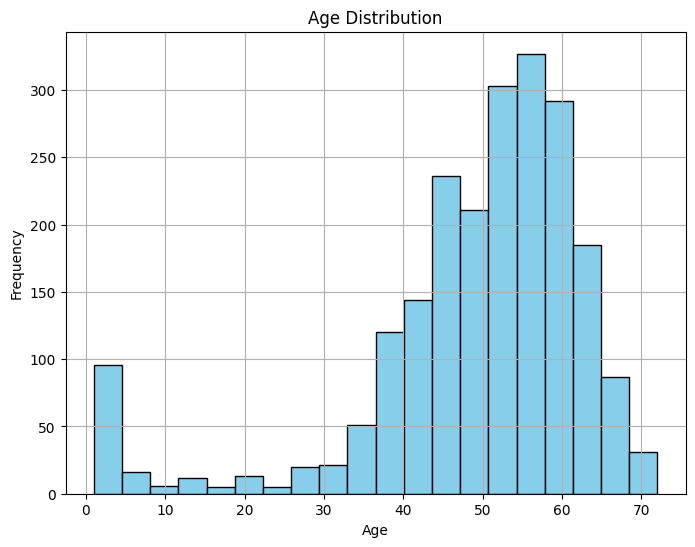

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(df_leiko['age'].dropna(), bins=20, color='skyblue', edgecolor='black')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [ ]:
df_all_annot.describe

,age,age at menarche,time to diagnosis,age in 2011,gender (1=woman; 0=man),cd8t cell proportion,cd4t cell proportion,nk cell proportion,bcell cell proportion,monocyte proportion,...,sentrix id,experiment,age at collection months,dna methylation age,age acceleration vs controls,age acceleration vs controls in children,cor sample vs gold standard,sentrix barcode,"diseasestatus (1=control, 2=scz patient)",family
count,2871.000000,970.000000,573.000000,184.000000,184.000000,184.000000,184.000000,184.000000,184.000000,184.000000,...,1.920000e+02,192.000000,134.000000,113.000000,113.000000,25.000000,113.000000,9.500000e+01,95.000000,87.000000
mean,44.189615,12.697938,5.355503,44.222826,0.603261,0.083498,0.179079,0.090855,0.058479,0.092108,...,5.887905e+09,2.000000,55.328358,36.770008,0.060847,0.198647,0.969432,5.773469e+09,1.652632,21.620690
std,17.748733,1.511052,3.625581,3.247415,0.490556,0.038460,0.066993,0.046042,0.028158,0.024117,...,1.974620e+08,0.708955,49.257613,18.228231,3.571425,1.329667,0.001812,3.493967e+03,0.478660,14.190761
min,0.000000,9.000000,0.019000,40.000000,0.000000,0.000000,0.006400,0.001600,0.000000,0.031500,...,5.771710e+09,1.000000,12.000000,1.955204,-6.578004,-1.658276,0.962927,5.773467e+09,1.000000,1.000000
25%,34.000000,12.000000,1.979000,40.000000,0.000000,0.058150,0.134150,0.057600,0.037975,0.074000,...,5.774512e+09,1.750000,24.000000,31.228150,-2.135993,-0.733748,0.968511,5.773467e+09,1.000000,10.000000
50%,48.958000,13.000000,4.761000,43.000000,1.000000,0.083000,0.179950,0.082450,0.053900,0.089450,...,5.775446e+09,2.000000,37.000000,42.411508,-0.341409,-0.061843,0.969956,5.773467e+09,2.000000,20.000000
75%,57.000000,14.000000,8.060000,46.000000,1.000000,0.104325,0.217850,0.122475,0.075575,0.107300,...,5.888839e+09,2.250000,58.000000,49.790108,1.986226,1.316341,0.970778,5.773471e+09,2.000000,30.000000
max,103.000000,18.000000,14.396000,49.000000,1.000000,0.191900,0.382000,0.268600,0.149000,0.161700,...,6.229017e+09,3.000000,203.000000,65.395595,13.801812,3.738425,0.971870,5.773475e+09,2.000000,52.000000


# Choose one dataframe

In [ ]:
df_all_annot['cohort'].unique()

array(['GSE42861_annot.csv', 'GSE51032_annot.csv', 'GSE69270_annot.csv',
       'GSE36054_annot.csv', 'GSE64495_annot.csv', 'GSE30870_annot.csv',
       'GSE41169_annot.csv', 'GSE73103_annot.csv', 'GSE52588_annot.csv',
       'GSE51057_annot.csv'], dtype=object)

In [10]:
cohort_name = 'GSE42861_annot.csv'

In [ ]:
subdf_annot = df_all_annot[df_all_annot['cohort']==cohort_name]
subdf_idx = subdf_annot.index
subdf = df.loc[subdf_idx].drop_duplicates()

In [ ]:
subdf_annot.shape

(689, 95)

Plot age distribution for the current cohort

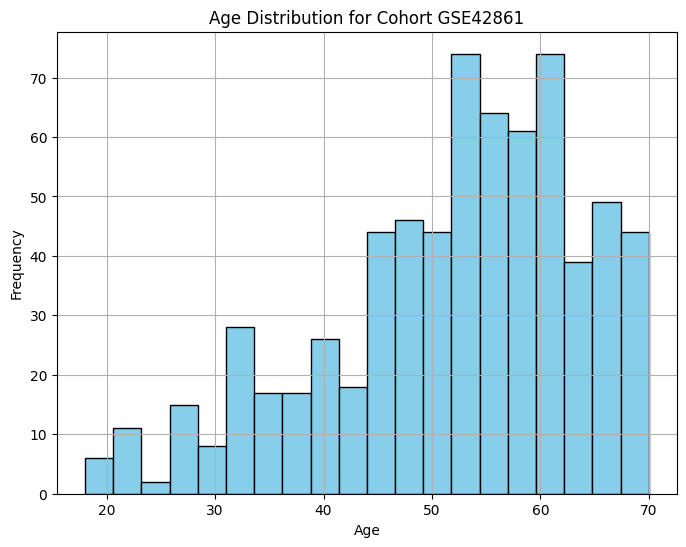

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(subdf_annot['age'], bins=20, color='skyblue', edgecolor='black')
plt.title(f'Age Distribution for Cohort {cohort_name[:-10]}')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [ ]:
subdf_idx

Index(['GSM1051525', 'GSM1051526', 'GSM1051527', 'GSM1051528', 'GSM1051529',
       'GSM1051530', 'GSM1051531', 'GSM1051532', 'GSM1051533', 'GSM1051534',
       ...
       'GSM1052204', 'GSM1052205', 'GSM1052206', 'GSM1052207', 'GSM1052208',
       'GSM1052209', 'GSM1052210', 'GSM1052211', 'GSM1052212', 'GSM1052213'],
      dtype='object', name='GSM', length=687)

In [ ]:
subdf


,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700,age
GSM,,,,,,,,,,,,,,,,,,,,,
GSM1051525,0.224142,0.167473,0.252797,0.767779,0.292238,0.289371,0.375905,0.522142,0.411905,0.453685,...,0.395075,0.243713,0.249575,0.858602,0.268208,0.602051,0.855962,0.592358,0.825162,67.0
GSM1051526,0.219361,0.156888,0.173419,0.753855,0.321734,0.314705,0.330767,0.625400,0.466970,0.561958,...,0.400635,0.257338,0.242520,0.851584,0.264483,0.510362,0.852624,0.594299,0.880614,49.0
GSM1051527,0.137153,0.060801,0.135405,0.832557,0.106155,0.186398,0.252518,0.531337,0.466123,0.528114,...,0.318659,0.196490,0.121846,0.886259,0.215812,0.690511,0.837179,0.656277,0.894600,53.0
GSM1051528,0.191287,0.153258,0.181326,0.805664,0.255982,0.281080,0.345738,0.499670,0.384548,0.516283,...,0.427026,0.256310,0.227496,0.886949,0.279397,0.573916,0.845085,0.540028,0.885426,62.0
GSM1051529,0.210777,0.127497,0.139660,0.689237,0.288889,0.233415,0.346164,0.710315,0.474954,0.559628,...,0.372686,0.292122,0.243244,0.871077,0.260122,0.555962,0.493836,0.540540,0.859882,33.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM1052209,0.196253,0.109052,0.166435,0.677873,0.263343,0.260320,0.377650,0.708952,0.352601,0.479325,...,0.336245,0.259160,0.270883,0.847848,0.280030,0.553248,0.815169,0.493919,0.834708,63.0
GSM1052210,0.184801,0.031317,0.049061,0.616858,0.114680,0.197512,0.231165,0.594308,0.463402,0.651279,...,0.340782,0.314015,0.124320,0.885653,0.172468,0.210951,0.874772,0.663732,0.508883,63.0
GSM1052211,0.194609,0.179559,0.219951,0.715996,0.280194,0.308385,0.387242,0.590796,0.400345,0.510847,...,0.358716,0.261441,0.241423,0.819663,0.264484,0.623068,0.834718,0.644287,0.860619,46.0


Check for and remove any duplicate indexes with different values. (All complete duplicates were already removed earlier)

In [ ]:
idx_in_df = list(df.index)
dupls_in_df = list(set(n for n in idx_in_df if idx_in_df.count(n) > 1))
subdf.loc[dupls_in_df]

In [ ]:
subdf_idx = subdf_idx.drop(dupls_in_df)
subdf_annot = subdf_annot.loc[subdf_idx]
subdf = subdf.loc[subdf_idx]

In [ ]:
len(subdf) == len(subdf_annot)


True

# Make dataset with ages and mean values calculated as distribution peak
(kinda mode)

And this mode are calculcated as sliding window across 3 years

In [9]:
import pandas as pd
import numpy as np

from typing import List
from scipy.signal import find_peaks
from concurrent.futures import ProcessPoolExecutor

In [ ]:
subdf = subdf.join(subdf_annot['age'])
subdf.columns

Index(['cg00008647', 'cg00295572', 'cg00346208', 'cg00448707', 'cg00563824',
       'cg00664416', 'cg00764612', 'cg00908766', 'cg00951395', 'cg01101873',
       ...
       'cg19543968', 'cg19558972', 'cg19713460', 'cg19800640', 'cg19855470',
       'cg21401457', 'cg21445911', 'cg24435209', 'cg26169700', 'age'],
      dtype='object', length=4457)

In [ ]:
def compute_peak_values(cpg_site: str) -> List[float]:
    """
    Compute peak values for a single CpG site.

    Note: 'subdf' is declared as a global variable outside the function for the sake of facilitating multiprocessing.

    Parameters:
        cpg_site (str): CpG site identifier.

    Returns:
        List[float]: List of peak values for the specified CpG site.
    """
    peak_values = []
    for age in subdf['age'].unique():
        subset = subdf[subdf['age'] == age][cpg_site]
        density, bins = np.histogram(subset, bins=30, density=True)
        peaks, _ = find_peaks(density, height=0)
        if len(peaks) > 0:
            peak_values.append(bins[peaks[0]])
        else:
            peak_values.append(np.nan)
    return peak_values

In [ ]:
%%time

# Instantiate a ProcessPoolExecutor to expedite processing
with ProcessPoolExecutor(max_workers=4) as executor:
    futures = [executor.submit(compute_peak_values, cpg_site) for cpg_site in subdf.columns[:-1]]
    peak_values_all_cpg = [future.result() for future in futures]

peak_values_df = pd.DataFrame(peak_values_all_cpg, index=subdf.columns[:-1], columns=subdf['age'].unique()).T

In [ ]:
peak_values_df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
1,0.108154,0.089437,0.147150,0.710120,0.151313,0.212086,0.267615,0.628234,0.320082,0.531295,...,0.452649,0.372807,0.251165,0.162933,0.882422,0.213480,0.546229,0.841378,0.557274,0.834416
1,0.143779,0.083461,0.133684,0.698195,0.177996,0.211499,0.262981,0.552602,0.326544,0.539185,...,0.452590,0.362316,0.253695,0.158679,0.662127,0.221272,0.544482,0.851175,0.505684,0.832397
1,0.119253,0.054882,0.149779,0.724379,0.222509,0.219996,0.271514,0.727437,0.392743,0.522625,...,0.464880,0.361293,0.345555,0.204217,0.888022,0.223934,0.634218,0.846366,0.579635,0.857421
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.126026,0.088067,NaN,NaN,0.175938,0.252062,0.273072,0.613185,0.373505,NaN,...,0.456687,0.361849,0.319683,0.179751,NaN,0.222645,NaN,0.846455,0.556692,0.833314


Uncomment the following line to save the DataFrame with peak values

In [ ]:
# peak_values_df.to_csv(f'{cohort_name[:9]}peak_values.csv')

# Make different clusterization

In [11]:
# peak_df = peak_values_df
#or
peak_df = pd.read_csv(os.path.join(directory_path, f'{cohort_name[:9]}peak_values.csv'), index_col=0)

In [12]:
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from scipy.cluster import hierarchy

### For visualization

In [13]:
from plot_clustering_results import plot_umap_and_tsne, plot_pca, cut_clustermap_tree, plot_top_trends_for_each_cluster

In [14]:
x_for_pca = peak_df.T.fillna(0)
pca = PCA(n_components=2)
components = pca.fit_transform(x_for_pca)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.87454639 0.01743021]
[87.88253659 12.40687641]


In [15]:
components_df = pd.DataFrame(components, columns=['x', 'y'])

## Seeking correlated CpGs

In [16]:
%%time
corr_matrix = peak_df.corr()

CPU times: user 4.73 s, sys: 167 ms, total: 4.9 s
Wall time: 10.3 s


In [17]:
corr_matrix.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
cg00008647,1.000000,0.394372,0.256660,0.138167,0.521724,0.505061,0.478496,0.316168,0.200025,0.307008,...,0.260822,0.260993,0.608362,0.628701,0.086227,0.316031,0.046080,0.112096,0.329238,0.159702
cg00295572,0.394372,1.000000,0.489247,-0.098632,0.264485,0.268088,0.447683,-0.137637,0.054799,-0.317326,...,-0.279177,-0.264192,0.281575,0.258668,0.122421,0.351561,-0.322668,-0.141505,-0.226298,-0.232346
cg00346208,0.256660,0.489247,1.000000,-0.155437,0.316347,0.262879,0.514100,-0.342002,0.101643,-0.272644,...,-0.264295,-0.384431,0.242163,0.379979,0.005198,0.516409,-0.149725,-0.111793,-0.240564,-0.268031
cg00448707,0.138167,-0.098632,-0.155437,1.000000,0.100471,0.136855,-0.086258,0.183938,0.084618,0.355135,...,0.387740,0.185805,0.142643,0.088995,0.122297,0.027666,0.295079,0.104383,0.244023,0.248431
cg00563824,0.521724,0.264485,0.316347,0.100471,1.000000,0.484440,0.264082,0.318017,0.147758,0.206282,...,0.274987,0.151373,0.384243,0.447868,0.176062,0.164780,0.189716,0.004150,0.199911,0.163719


## Clustering

### k means

In [ ]:
%%time
km_scores= []

for i in range(2,15):
    km = KMeans(n_clusters=i, random_state=0).fit(corr_matrix);
    preds = km.predict(corr_matrix);
    km_scores.append(-km.score(corr_matrix))

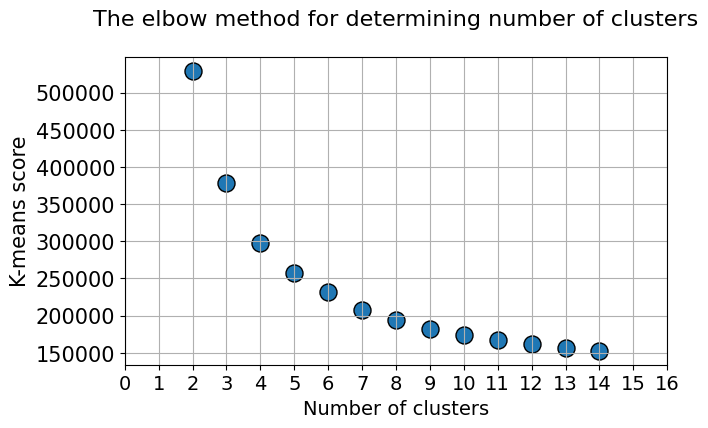

In [ ]:
plt.figure(figsize=(7,4))
plt.title("The elbow method for determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,15)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(0,17)],fontsize=14)
plt.yticks(fontsize=15)
plt.show();

Although the elbow method suggests choosing 5 clusters, for our specific analysis focused on identifying the most correlated CpGs among individuals aged 24, 37, and 60 years old, I have opted to proceed with 8 clusters for further investigation

In [ ]:
%%time
kmeans = KMeans(n_clusters=8, random_state=0, n_init="auto").fit(corr_matrix)
kmeans.labels_

CPU times: user 4.4 s, sys: 323 ms, total: 4.72 s
Wall time: 4.14 s


array([5, 0, 0, ..., 3, 1, 1], dtype=int32)

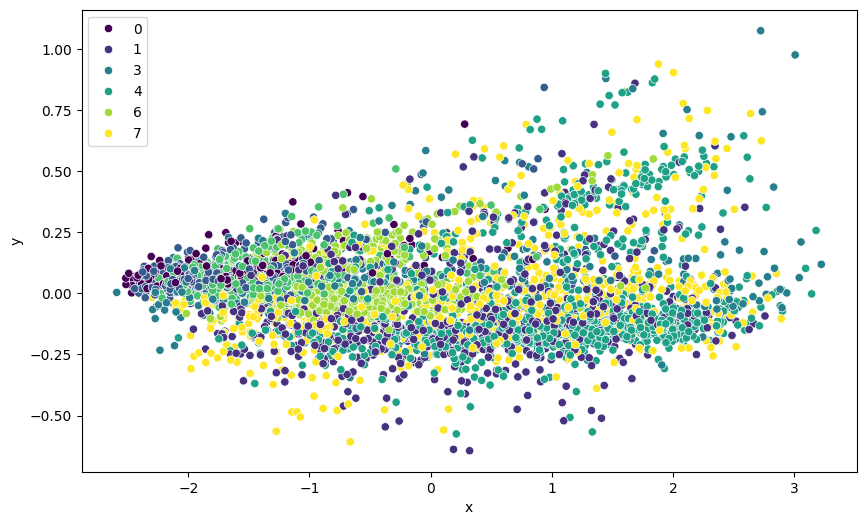

In [ ]:
plot_pca(kmeans.labels_, components_df)

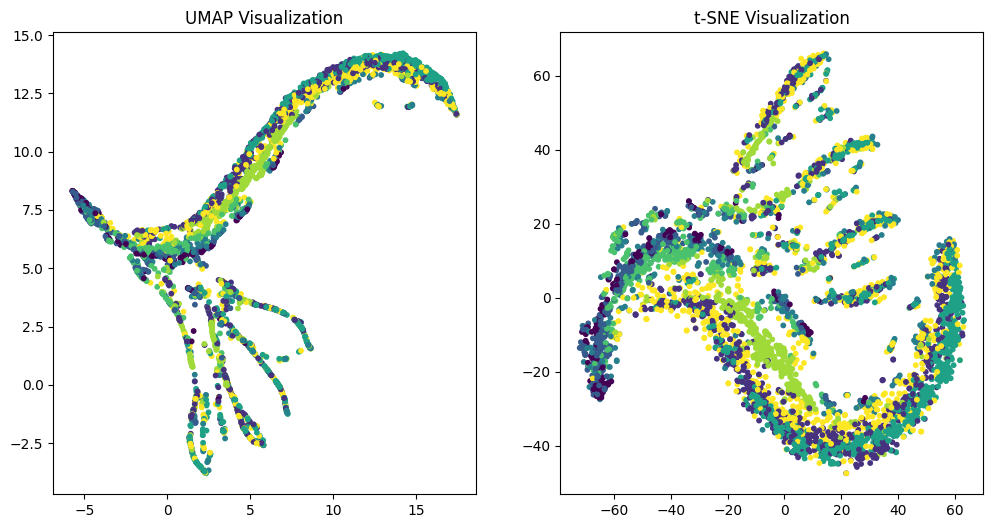

In [ ]:
plot_umap_and_tsne(kmeans.labels_, x_for_pca)

### hierarchical clustering

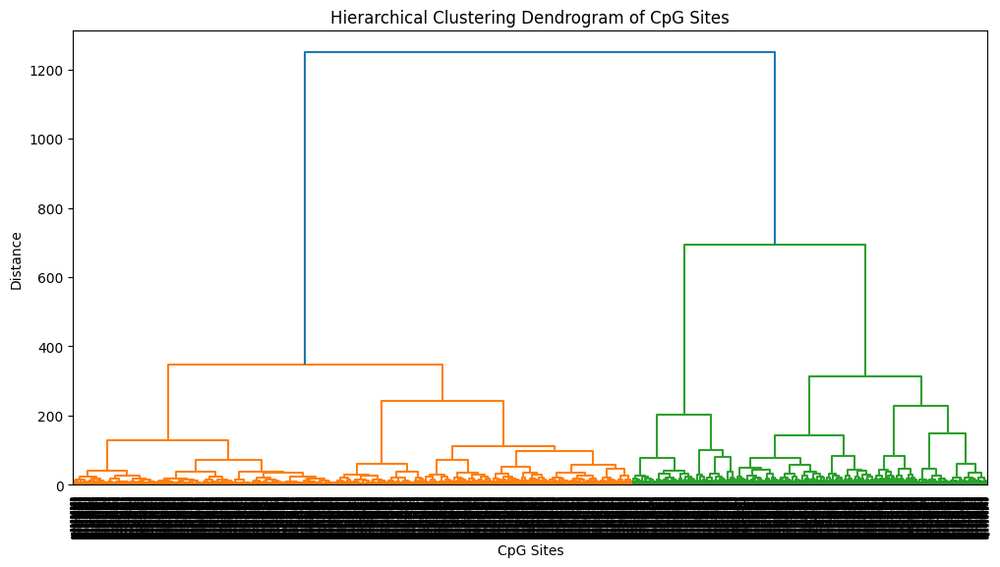

In [ ]:
linkage = hierarchy.linkage(corr_matrix, method='ward')

plt.figure(figsize=(12, 6))
dendrogram = hierarchy.dendrogram(linkage, labels=corr_matrix.columns, leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram of CpG Sites')
plt.xlabel('CpG Sites')
plt.ylabel('Distance')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



<Figure size 3000x2000 with 0 Axes>

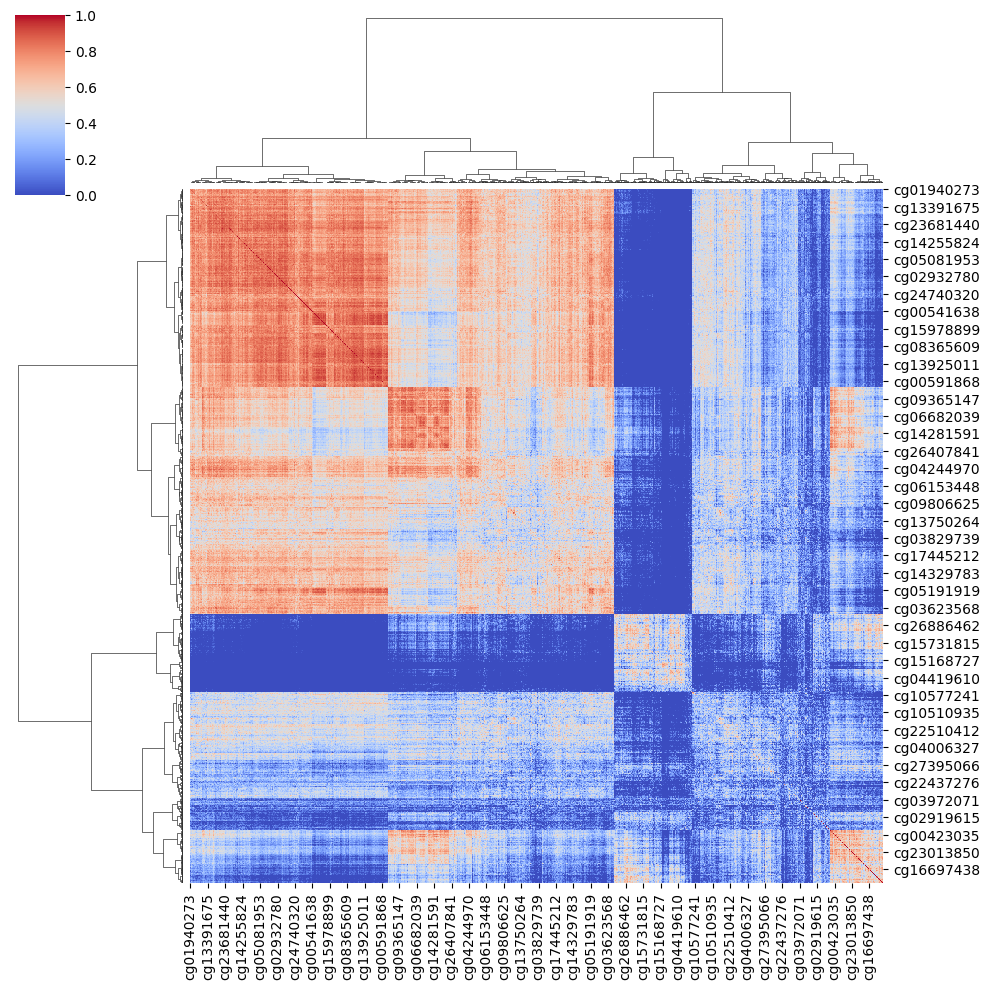

In [18]:
plt.figure(figsize=(30, 20))
s = sns.clustermap(corr_matrix, annot=False, cmap='coolwarm', vmin=0, vmax=1, method='ward')
plt.show()

In [19]:
clustermap_results = np.array(cut_clustermap_tree(s, 8, False))

In [20]:
clustermap_results = clustermap_results - 1

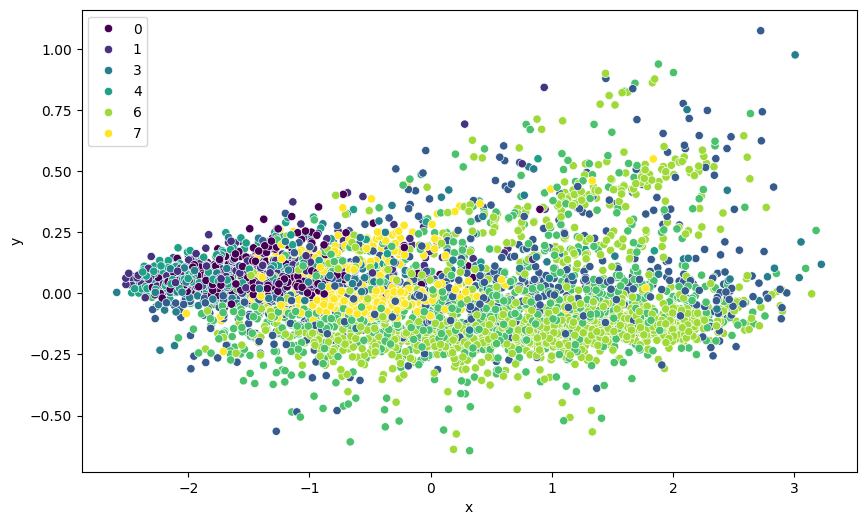

In [ ]:
plot_pca(clustermap_results, components_df)

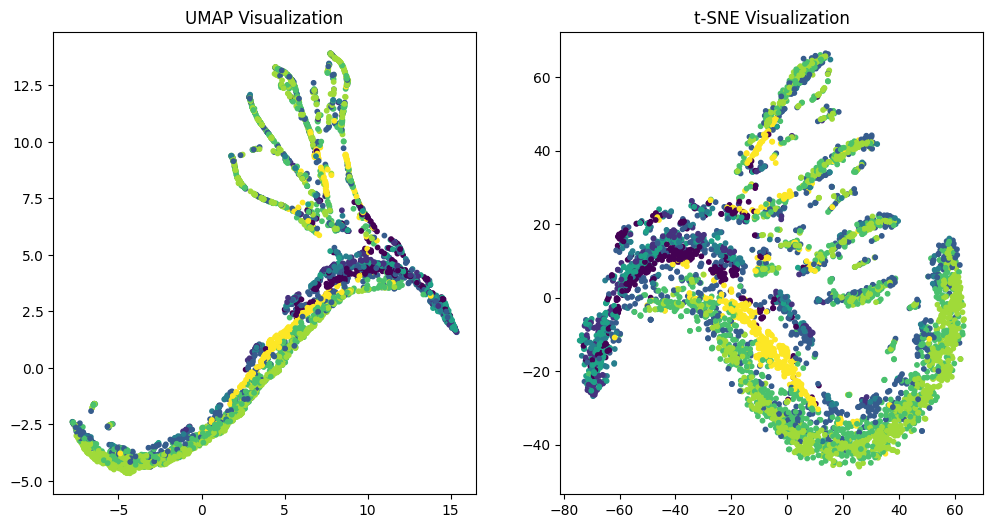

In [ ]:
plot_umap_and_tsne(clustermap_results, x_for_pca)

### DBSCAN

In [ ]:
dbscan = DBSCAN(eps=1, min_samples=2)
dbscan.fit(corr_matrix)
cluster_labels = dbscan.labels_

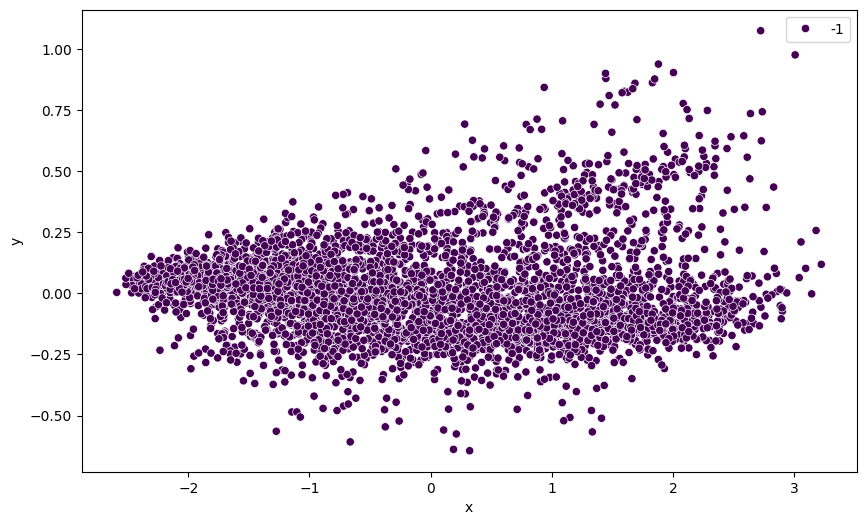

In [ ]:
plot_pca(cluster_labels, components_df)

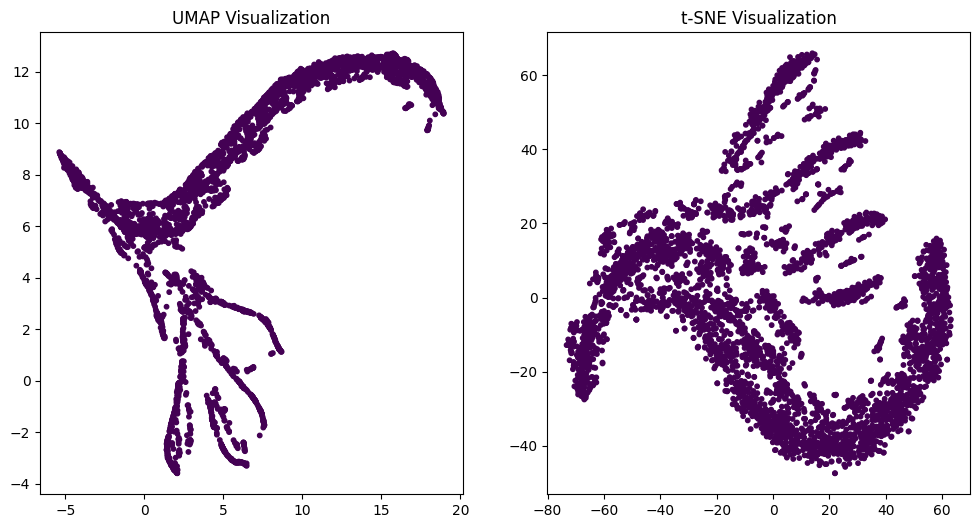

In [ ]:
plot_umap_and_tsne(cluster_labels, x_for_pca)

DBSCAN is the least suitable clustering algorithm for this dataset. I will not utilize it for plotting the trends

### Gaussian Mixture

In [27]:
%%time
gmm = GaussianMixture(n_components=8, random_state=42)
gmm.covariance_type = 'diag'
# gmm.init_params = 'kmeans' # too long
gmm.fit(corr_matrix)
cluster_labels_gmm = gmm.predict(corr_matrix)
cluster_labels_gmm

CPU times: user 19.8 s, sys: 7.26 s, total: 27 s
Wall time: 16.9 s


array([2, 7, 7, ..., 5, 1, 1])

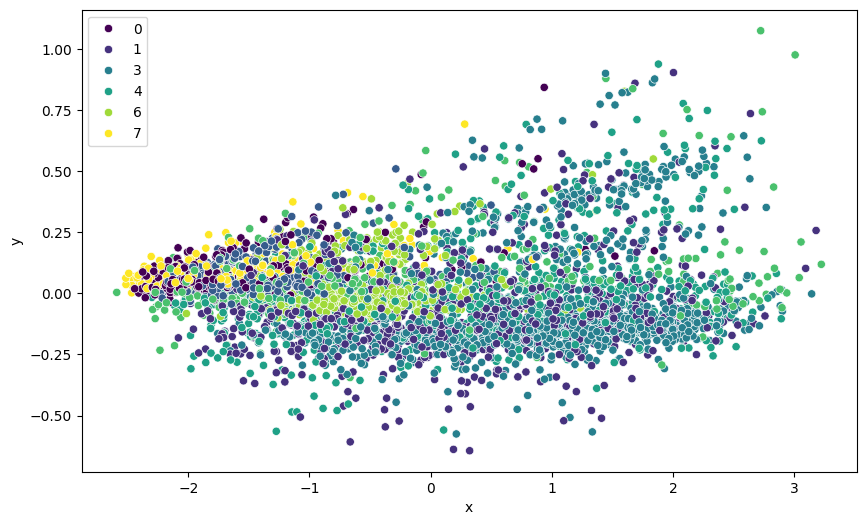

In [29]:
plot_pca(cluster_labels_gmm, components_df)

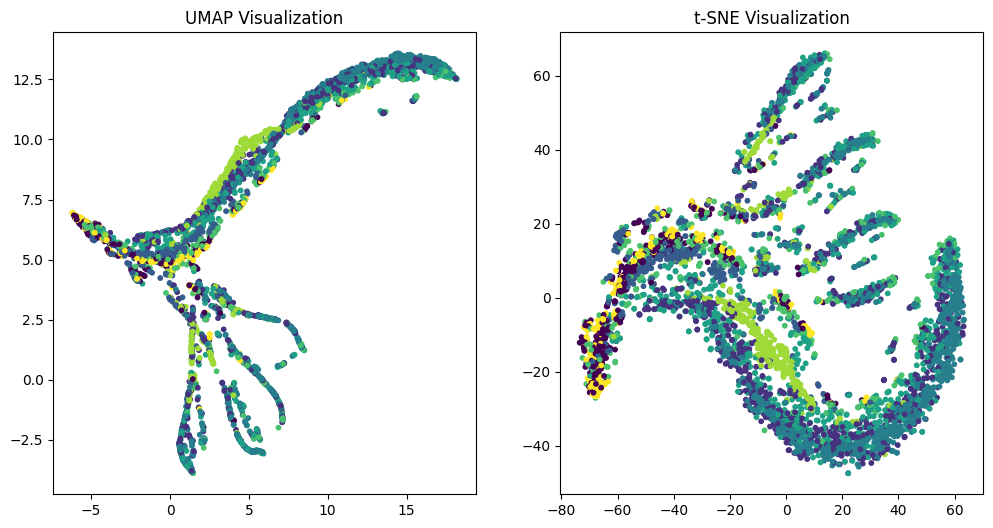

In [30]:
plot_umap_and_tsne(cluster_labels_gmm, x_for_pca)

As we will observe from trend analysis and comparison with metacohort analysis (Check the section **"Plot clusters defined in metacohort data on the GSE42861 dataset"**  for this), Gaussian Mixture is the optimal clustering algorithm for methylation data. Therefore, in the next lines, I will save the clustering result for one chosen dataset.

In [ ]:
# x_for_pca['clusters'] = cluster_labels_gmm
# clustering_results = x_for_pca[['clusters']]
# clustering_results.to_csv(f'{cohort_name[:9]}GM_clustering_results.csv')

# Plot trend lines for each cluster

In [23]:
df_trans = peak_df.T
df_trans.columns = df_trans.columns.astype(int)
window_size = 2

mean_window_df = pd.DataFrame(index=df_trans.T.columns)

# Loop through each age. Before using this cell, verify that all ages exist with a step of 1.
for age in df_trans.columns:
    age_range = list(range(age - window_size, age + window_size + 1))
    age_range = [a for a in age_range if a >= df_trans.columns.min() and a <= df_trans.columns.max()]

    mean_values = df_trans[age_range].mean(axis=1)
    mean_window_df[age] = mean_values

# DataFrame with ages as rows and CpGs as columns
mean_window_df = mean_window_df.T
mean_window_df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
67,0.143566,0.081029,0.131869,0.623844,0.158553,0.170701,0.254243,0.440172,0.220727,0.390946,...,0.327637,0.254013,0.215897,0.166144,0.761994,0.227637,0.408622,0.764529,0.427321,0.694051
49,0.140999,0.067042,0.102751,0.648187,0.157766,0.171012,0.226420,0.474774,0.237859,0.445484,...,0.374199,0.275706,0.224071,0.157831,0.837235,0.213568,0.413305,0.832355,0.472545,0.763424
53,0.106691,0.066981,0.109968,0.636140,0.142742,0.146709,0.232714,0.422170,0.239331,0.406988,...,0.371172,0.269549,0.214477,0.146615,0.770680,0.214351,0.377179,0.772347,0.458959,0.718518
62,0.112648,0.068601,0.110890,0.641132,0.143511,0.186507,0.249299,0.465086,0.224853,0.429347,...,0.351518,0.267726,0.212302,0.148262,0.763141,0.213693,0.363143,0.773007,0.477872,0.743553
33,0.145499,0.070496,0.101116,0.657058,0.164817,0.179887,0.240767,0.587335,0.255789,0.512298,...,0.407799,0.338336,0.233050,0.156479,0.853669,0.202467,0.465331,0.825300,0.503409,0.829079


In [24]:
mean_window_df = mean_window_df.sort_index()
mean_window_df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
18,0.217077,0.035350,0.119327,0.672513,0.193396,0.265815,0.306462,0.654435,0.296330,0.619738,...,0.510829,0.399317,0.259163,0.220574,0.815767,0.231295,0.599741,0.830586,0.568579,0.880675
19,0.217077,0.035350,0.119327,0.672513,0.193396,0.265815,0.306462,0.654435,0.296330,0.619738,...,0.510829,0.399317,0.259163,0.220574,0.815767,0.231295,0.599741,0.830586,0.568579,0.880675
20,0.182791,0.043858,0.117688,0.648468,0.172184,0.233387,0.282552,0.657819,0.295816,0.603393,...,0.477270,0.388913,0.246914,0.190674,0.822665,0.219197,0.580860,0.830586,0.573670,0.868669
21,0.180058,0.052366,0.124666,0.640496,0.152395,0.196266,0.270903,0.630140,0.344547,0.599117,...,0.457464,0.407652,0.238400,0.178348,0.847339,0.203925,0.540281,0.852927,0.584477,0.868850
22,0.170579,0.058317,0.101501,0.647890,0.152895,0.191664,0.252955,0.670988,0.331297,0.610795,...,0.478817,0.421460,0.232598,0.172586,0.867338,0.192249,0.520777,0.854312,0.602080,0.876923


### for k means

In [ ]:
def plot_top_trends_for_each_cluster(df_mean_for_statistics):
    num_clusters = len(df_mean_for_statistics['cluster'].unique())
    num_rows = num_clusters // 2
    num_cols = 2

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

    # Flatten the axis objects if there is only one row
    if num_rows == 1:
        axs = axs.reshape(1, -1)

    # Loop through each cluster
    for cluster_id in range(0, num_clusters):
        cluster_data = df_mean_for_statistics[df_mean_for_statistics['cluster'] == cluster_id]

        # Calculate subplot index
        row_idx = (cluster_id) // num_cols
        col_idx = (cluster_id) % num_cols
        ax = axs[row_idx, col_idx]

        # Loop through top-40 CpG site in the cluster and plot
        for cg_value in cluster_data.index[:40]:
            subset = mean_window_df[[cg_value]].sort_index()
            ax.plot(subset.index, subset[cg_value], label='')

        ax.set_ylim(0, 1)
        ax.set_yticks(np.arange(0, 1.1, 0.2))

        min_age = df_mean_for_statistics.drop(columns=['cluster']).columns.min()
        max_age = df_mean_for_statistics.drop(columns=['cluster']).columns.max()
        ax.set_xticks(np.arange(min_age, max_age, 3))

        ax.set_xlabel('Age')
        ax.set_ylabel('CpG')
        ax.grid(True)
        ax.legend(loc='upper right')
        ax.text(0.5, 0.95, f'Cluster {cluster_id}', ha='center', va='center', transform=ax.transAxes, fontsize=12, fontweight='bold')


    plt.tight_layout()
    plt.show()

In [ ]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = kmeans.labels_
df_mean_for_statistics.head()

,18,19,20,21,22,23,24,25,26,27,...,62,63,64,65,66,67,68,69,70,cluster
cg00008647,0.217077,0.217077,0.182791,0.180058,0.170579,0.114444,0.114444,0.122205,0.120604,0.117252,...,0.112648,0.121997,0.124475,0.138341,0.131544,0.143566,0.147456,0.145762,0.143535,5
cg00295572,0.035350,0.035350,0.043858,0.052366,0.058317,0.041263,0.046790,0.046090,0.050190,0.056124,...,0.068601,0.075669,0.074752,0.076396,0.076866,0.081029,0.082301,0.081352,0.080301,0
cg00346208,0.119327,0.119327,0.117688,0.124666,0.101501,0.080684,0.084805,0.077399,0.080186,0.096583,...,0.110890,0.119615,0.123055,0.132656,0.130509,0.131869,0.131152,0.125733,0.117891,0
cg00448707,0.672513,0.672513,0.648468,0.640496,0.647890,0.699101,0.676719,0.677752,0.668542,0.671086,...,0.641132,0.639833,0.637812,0.627358,0.617848,0.623844,0.649737,0.650843,0.663043,3
cg00563824,0.193396,0.193396,0.172184,0.152395,0.152895,0.130646,0.155668,0.156950,0.167661,0.165791,...,0.143511,0.148065,0.152980,0.158599,0.159079,0.158553,0.169513,0.165786,0.165972,5


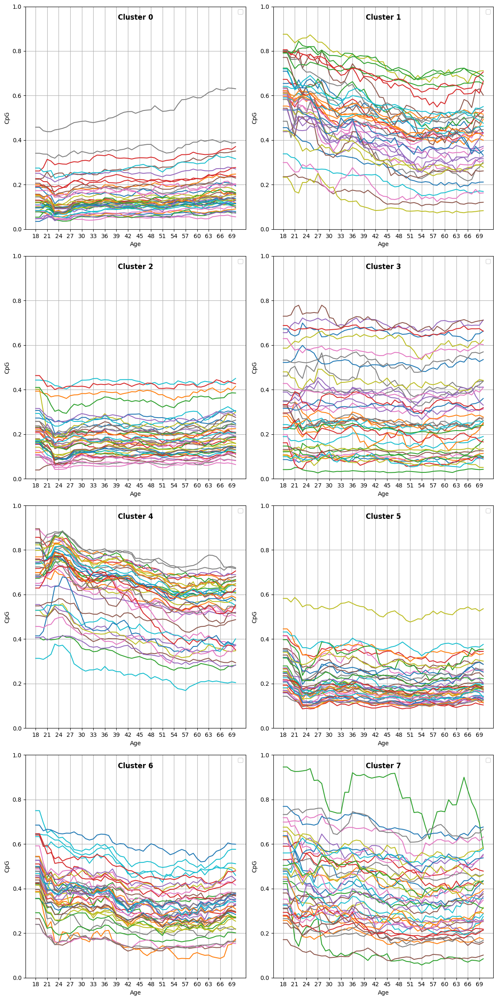

In [ ]:
plot_top_trends_for_each_cluster(df_mean_for_statistics)

<Axes: xlabel='24', ylabel='cluster'>

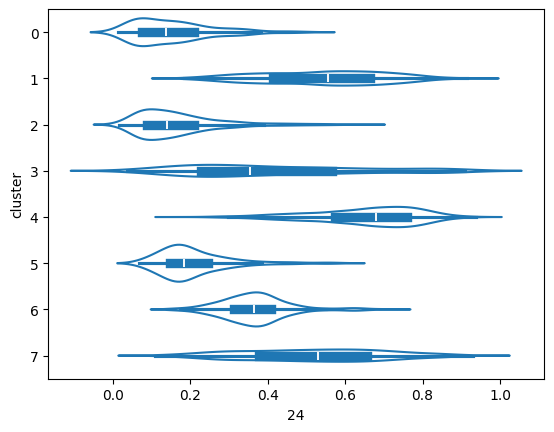

In [ ]:
sns.violinplot(data=df_mean_for_statistics, x=24, y="cluster", fill=False)

### for hierarchical clustering

In [39]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = clustermap_results
df_mean_for_statistics.head()

,18,19,20,21,22,23,24,25,26,27,...,62,63,64,65,66,67,68,69,70,cluster
cg00008647,0.217077,0.217077,0.182791,0.180058,0.170579,0.114444,0.114444,0.122205,0.120604,0.117252,...,0.112648,0.121997,0.124475,0.138341,0.131544,0.143566,0.147456,0.145762,0.143535,0
cg00295572,0.035350,0.035350,0.043858,0.052366,0.058317,0.041263,0.046790,0.046090,0.050190,0.056124,...,0.068601,0.075669,0.074752,0.076396,0.076866,0.081029,0.082301,0.081352,0.080301,1
cg00346208,0.119327,0.119327,0.117688,0.124666,0.101501,0.080684,0.084805,0.077399,0.080186,0.096583,...,0.110890,0.119615,0.123055,0.132656,0.130509,0.131869,0.131152,0.125733,0.117891,1
cg00448707,0.672513,0.672513,0.648468,0.640496,0.647890,0.699101,0.676719,0.677752,0.668542,0.671086,...,0.641132,0.639833,0.637812,0.627358,0.617848,0.623844,0.649737,0.650843,0.663043,2
cg00563824,0.193396,0.193396,0.172184,0.152395,0.152895,0.130646,0.155668,0.156950,0.167661,0.165791,...,0.143511,0.148065,0.152980,0.158599,0.159079,0.158553,0.169513,0.165786,0.165972,3


CPU times: user 280 ms, sys: 125 ms, total: 405 ms
Wall time: 489 ms


<Axes: xlabel='24', ylabel='cluster'>

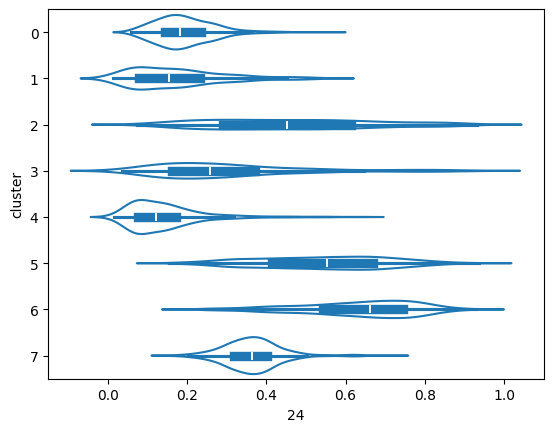

In [42]:
%%time
df_mean_for_statistics['cluster'] = df_mean_for_statistics['cluster'].astype('category')
sns.violinplot(data=df_mean_for_statistics, x=24, y="cluster", fill=False)

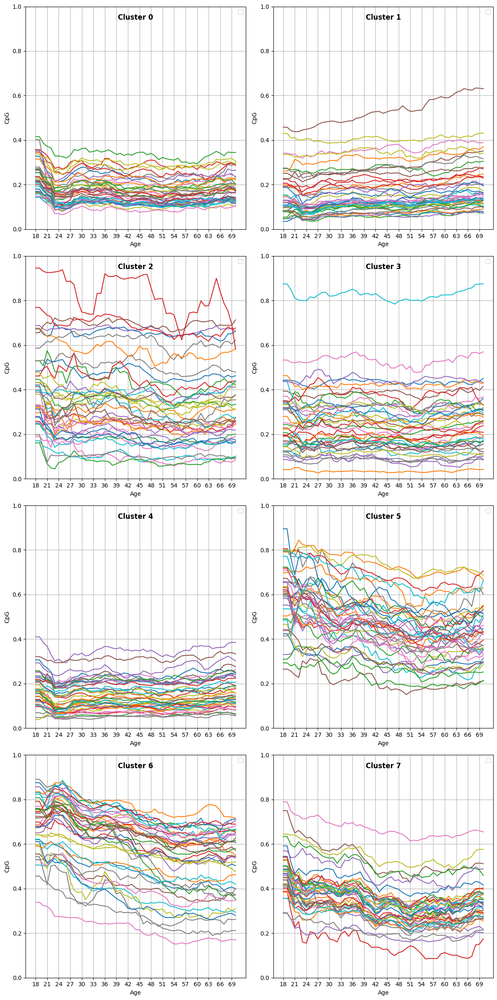

In [26]:
plot_top_trends_for_each_cluster(df_mean_for_statistics, mean_window_df)

### for Gaussian Mixture

<Axes: xlabel='24', ylabel='cluster'>

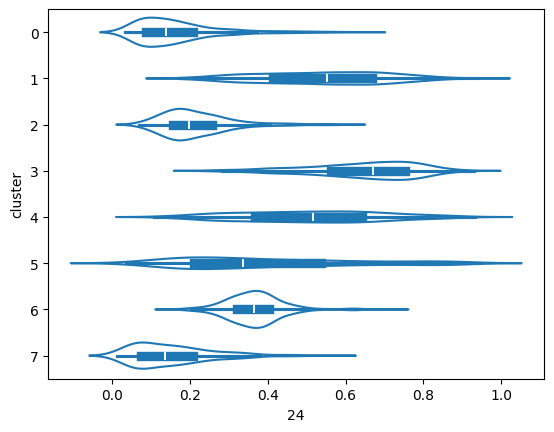

In [43]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = cluster_labels_gmm
df_mean_for_statistics['cluster'] = df_mean_for_statistics['cluster'].astype('category')
sns.violinplot(data=df_mean_for_statistics, x=24, y="cluster", fill=False)

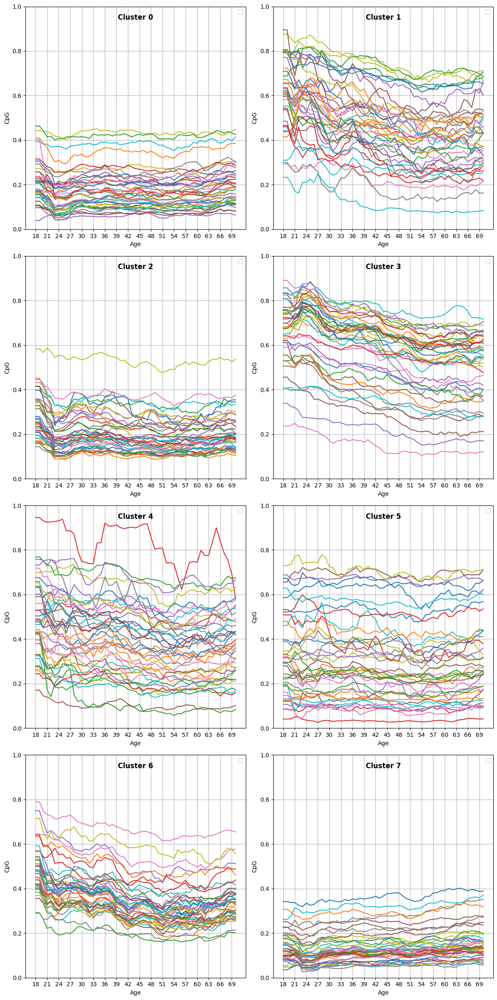

In [33]:
plot_top_trends_for_each_cluster(df_mean_for_statistics, mean_window_df)

In [ ]:
# mean_window_df.to_csv('mean_window_GSE42861.csv')

# Plot clusters defined in metacohort data on the GSE42861 dataset
(Select clusters from metacohort and visualize them specifically for GSE42861)

In [45]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = pd.read_csv(
    os.path.join(directory_path, 'PBMC_GM_clustering_results.csv'), index_col=0)['clusters']
# sns.violinplot(data=df_mean_for_statistics, x=24, y="cluster", fill=False)

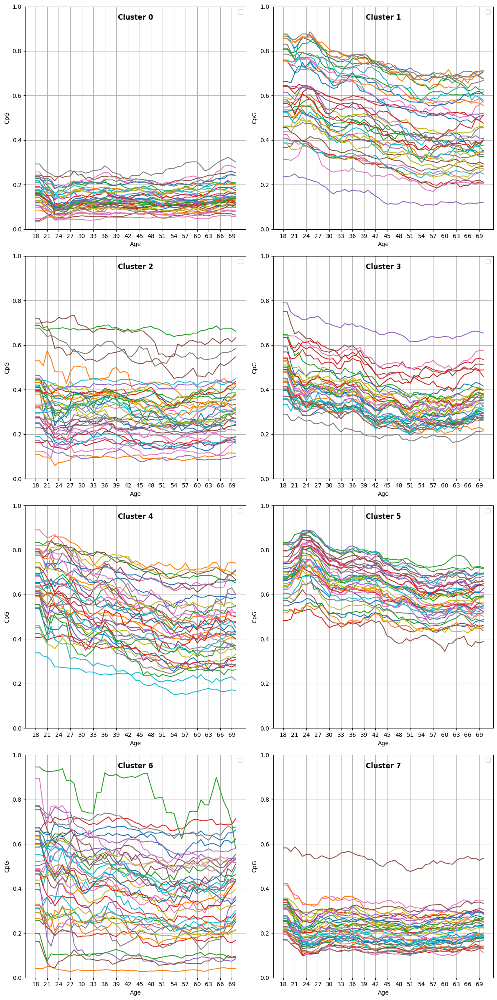

In [46]:
plot_top_trends_for_each_cluster(df_mean_for_statistics, mean_window_df)